In [ ]:
from google.colab import drive
import pandas as pd
from sklearn import metrics
import numpy as np
from matplotlib import  pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Read cluster labels
population_names_path = "/content/drive/My Drive/COMP 991/population_names_Levine_32dim.txt"
with open(population_names_path, "r") as f:
  clusters = f.readlines()

clusters = [i.strip("\n").split("\t") for i in clusters[1:]]
cluster_label_map = dict([(j,int(i)) for i,j in clusters])
cluster_map = dict([(int(i), j) for i,j in clusters])
cluster_label_map, cluster_map

({'Basophils': 1,
  'CD16+_NK_cells': 3,
  'CD16-_NK_cells': 2,
  'CD34+CD38+CD123+_HSPCs': 5,
  'CD34+CD38+CD123-_HSPCs': 4,
  'CD34+CD38lo_HSCs': 6,
  'CD4_T_cells': 7,
  'CD8_T_cells': 8,
  'Mature_B_cells': 9,
  'Monocytes': 10,
  'Plasma_B_cells': 12,
  'Pre_B_cells': 13,
  'Pro_B_cells': 14,
  'pDCs': 11},
 {1: 'Basophils',
  2: 'CD16-_NK_cells',
  3: 'CD16+_NK_cells',
  4: 'CD34+CD38+CD123-_HSPCs',
  5: 'CD34+CD38+CD123+_HSPCs',
  6: 'CD34+CD38lo_HSCs',
  7: 'CD4_T_cells',
  8: 'CD8_T_cells',
  9: 'Mature_B_cells',
  10: 'Monocytes',
  11: 'pDCs',
  12: 'Plasma_B_cells',
  13: 'Pre_B_cells',
  14: 'Pro_B_cells'})

In [ ]:
orig_data_path = "/content/drive/My Drive/COMP 991/Levine_32_matrix.csv"
orig_data = pd.read_csv(orig_data_path)
orig_data = orig_data.loc[~orig_data.label.isna()]
orig_labels = orig_data.iloc[:, -1]
orig_data['label_names'] = orig_data['label'].apply(lambda x: cluster_map[x])

print(orig_data.shape)



kmeans_data_path = "/content/drive/My Drive/COMP 991/100k_kmeans.csv"
kmeans_data = pd.read_csv(kmeans_data_path)
kmeans_data = kmeans_data.loc[~kmeans_data.label.isna()]
kmeans_labels = kmeans_data.iloc[:, -1]
kmeans_data['label_names'] = kmeans_data['label'].apply(lambda x: cluster_map[x])



# # Normalize
# norm_data = (data - data.mean())/data.std()
# norm_data['label'] = labels
# norm_data['label_names'] = norm_data['label'].apply(lambda x: cluster_map[x])

print(kmeans_data.shape)

(104184, 34)
(104184, 34)


In [ ]:
celltype_foreground_mapping = {
    "Basophils" : ["CD123", "HLA-DR"],
    "CD16+_NK_cells" : ["CD7", "CD16"],
    "CD34+CD38+CD123-_HSPCs" : ["CD34", "CD38"],
    "CD4_T_cells" : ["CD3", "CD4"],
    "CD8_T_cells" : ["CD3", "CD8"],
    "pDCs" : ["CD123", "HLA-DR"],
    "Plasma_B_cells" : ["CD19", "CD38"],
    "Pre_B_cells" : ["CD19", "CD20"],

    "CD34+CD38+CD123+_HSPCs" : ["CD34", "CD38", "CD123"],
    "Mature_B_cells" : ["CD19"],
    "Monocytes" : ["CD14"],
    "CD34+CD38lo_HSCs" : ["CD34"],
    "CD16-_NK_cells" : ["CD7"],
    "Pro_B_cells" : ["CD19"]
    }

In [ ]:
cluster_name = "CD4_T_cells"
orig_data.loc[orig_data.label == cluster_label_map[cluster_name]].shape, kmeans_data.loc[kmeans_data.label == cluster_label_map[cluster_name]].shape

((26366, 34), (14999, 34))

In [ ]:
color_palette = ['b', 'g', 'r', 'c', 'm', 'y', 'tab:blue', 'tab:orange','tab:green','tab:red','tab:purple','tab:brown','tab:pink','tab:gray']

In [ ]:
# No longer subsampling. Plotting all points of all clusters
def get_scatter(norm_data, cluster_name, feats = None, one_vs_rest = True):

  if(feats is None):
    feats = fground_labels[cluster_name]
  cluster_data = norm_data.loc[norm_data.label == cluster_label_map[cluster_name]]
  rest_data = norm_data.loc[norm_data.label != cluster_label_map[cluster_name]]

  # sample_count = 300
  cluster_sample = cluster_data #.sample(sample_count, random_state=100)
  rest_sample = rest_data #.groupby("label").apply(lambda x: x.sample(sample_count, random_state=100))

  fig, ax = plt.subplots(1,1, figsize=(20,10))
  if(one_vs_rest):
    sns.scatterplot(x=feats[0], y=feats[1], data=rest_sample, color='tab:orange')
  else:
    sns.scatterplot(x=feats[0], y=feats[1], data=rest_sample, hue="label_names", palette=color_palette[1:], s=50)
  
  sns.scatterplot(x=feats[0], y=feats[1], data=cluster_sample, hue="label_names", palette=color_palette[:1], marker='X', s=100)

  ax.set_title(cluster_name)
  return fig

In [ ]:
kmeans_subset = kmeans_data.loc[(kmeans_data['CD38'] > 5.5) & (kmeans_data['CD19'] > 1)]['label']
orig_subset = orig_data.loc[(orig_data['CD38'] > 5.5) & (orig_data['CD19'] > 1)]['label']

In [ ]:
kmeans_subset.shape, orig_subset.shape

((413,), (413,))

In [ ]:
# Row indices are the true cluster labels (i), columns are the predicted cluster labels (j), hungarian_cost_matrix[i][j] gives # of points from i clustered into j
hungarian_cost_matrix =       np.array([[    0,     0,     0,     0,     0,     0,     0,     0,     0,   0,     0,     0,     0,     0],
                                        [    0,     0,     0,     0,     0,     0,     0,     0,     0, 1207,    0,     0,     0,     0],
                                        [ 3852,     1,     1,     0,     0,     9,     0,     0,    27,   0,     2,    13,     0,     0],
                                        [ 2248,     0,     0,     0,     0,     0,     0,     0,     0,   0,     0,     0,     0,     0],
                                        [    0,     0,    28,     0,     0,     0,     4,     0,     0,   6,     0,     0,     0,  3257],
                                        [    0,     0,     0,     0,     0,     0,     0,     0,     0, 195,     0,     0,     0,   109],
                                        [    0,     0,     0,     0,     0,     0,     0,     0,     0,   0,     0,     0,     0,   916],
                                        [    0,  9754,     0,     0,     0,  7063,     0,     0,     5,   0,  9527,    17,     0,     0],
                                        [    0,   138,     0,     0,     0,   359,     0,     0,  9186,   0,   200, 10225,     0,     0],
                                        [    1,     0,   115,     0,  8142,     0,    11,    10,     0,   1,     0,     0,  8235,     5],
                                        [    2,     0,     3,  3884,     1,     1,  6250, 10957,     0,   1,     0,     0,     0,     0],
                                        [    0,     0,     0,     0,     0,     0,     0,     0,     0,1238,     0,     0,     0,     0],
                                        [    0,     0,   330,     0,     0,     0,     0,     0,     0,   0,     0,     0,     0,     0],
                                        [    0,     0,  5912,     0,    28,     0,     0,     0,     0,   2,     0,     0,   190,     3],
                                        [    0,     0,   293,     0,     0,     0,     0,     0,     0,   0,     0,     0,     1,   219]])

In [ ]:
# Predicted cluster assigned to original cluster
ls_assignment = { 5: 1,
                  0: 2,
                  4: 3,
                  13: 4,
                  6: 5,
                  3: 6,
                  1: 7,
                  11: 8,
                  12: 9,
                  7: 10,
                  9: 11,
                  8: 12,
                  2: 13,
                  10: 14}


In [ ]:
# kmeans predicted all Plasma_B_Cells values to same cluster (hungarian_assignment_matrix[12, 2])
# But it also predicted most of Pre_B_Cells to the same cluster (hungarian_assignment_matrix[13,2]). So Hungarian gave this priority (ls_assignment[2] = 13) and assigned some random cluster to Plasma_B_Cells

# This can be seen in the plots below

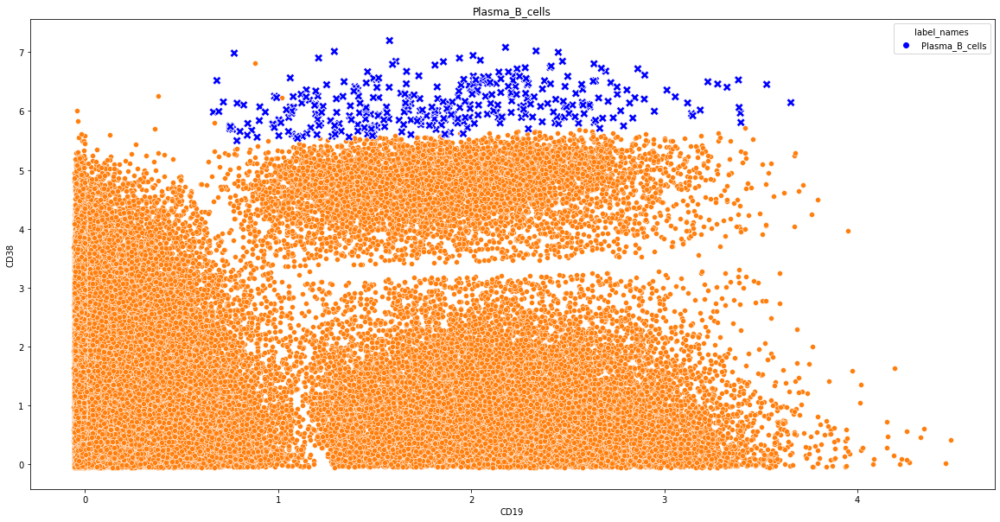

In [ ]:
# X represents the primary cluster
# change one_vs_rest parameter to get relevant plots

# One vs rest, Original Data
cluster_name = "Plasma_B_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

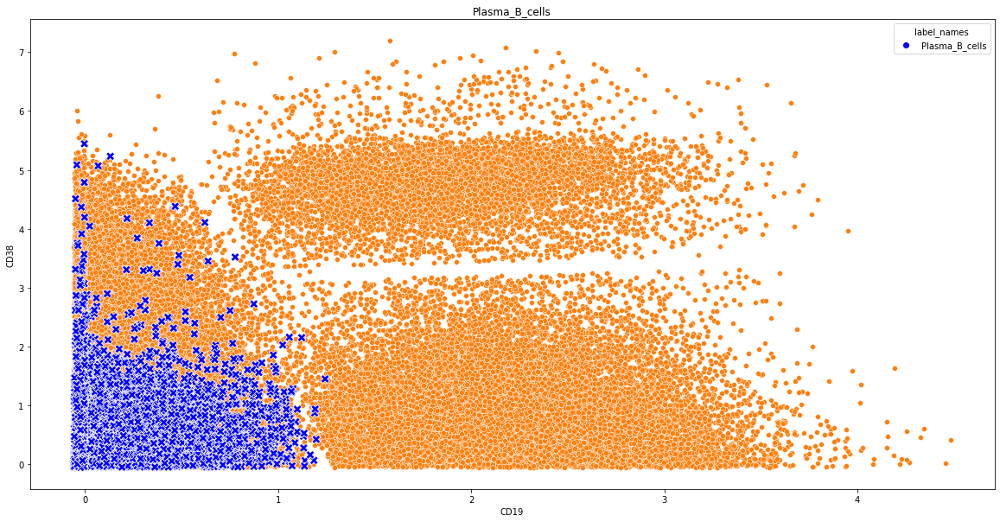

In [ ]:
# One vs rest, KMeans Data
cluster_name = "Plasma_B_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

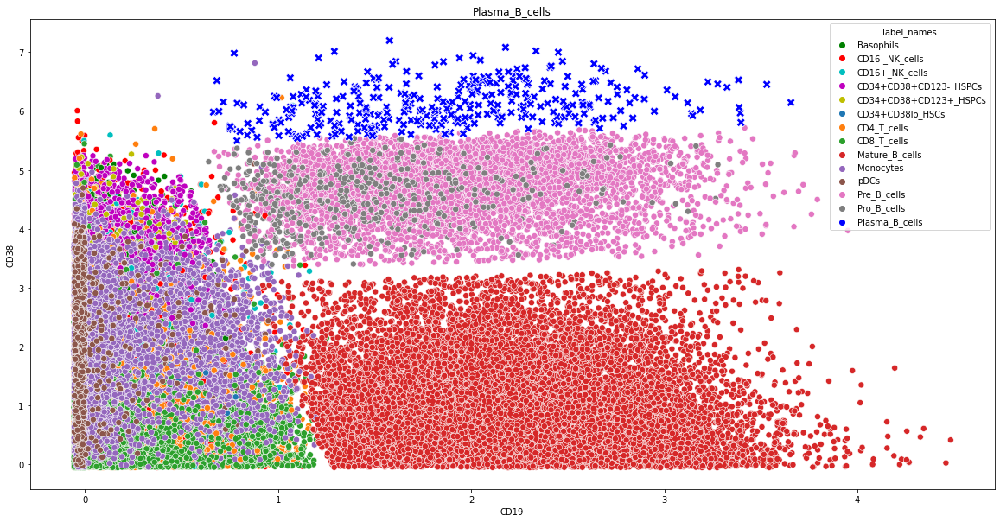

In [ ]:
# Indiv clusters, Original Data
cluster_name = "Plasma_B_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, False)

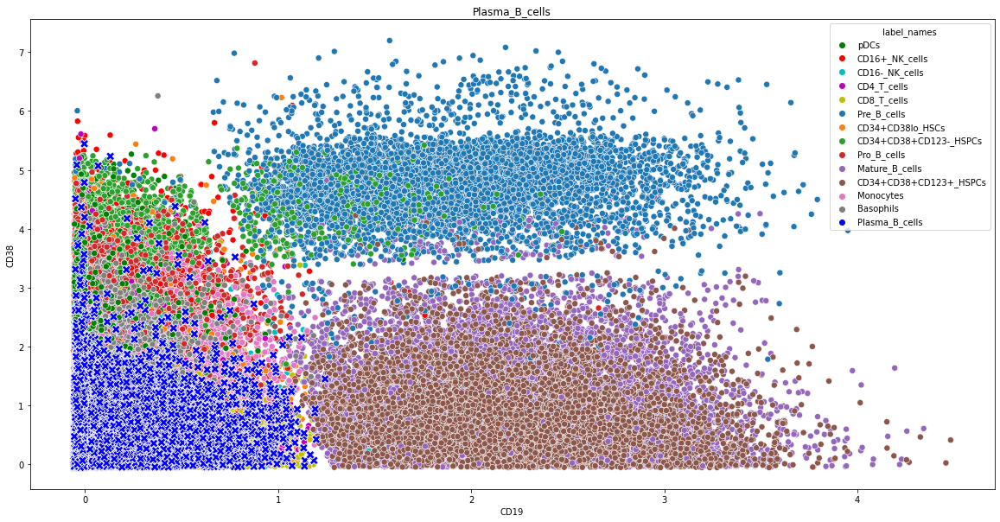

In [ ]:
# Indiv clusters, KMeans Data
cluster_name = "Plasma_B_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, False)

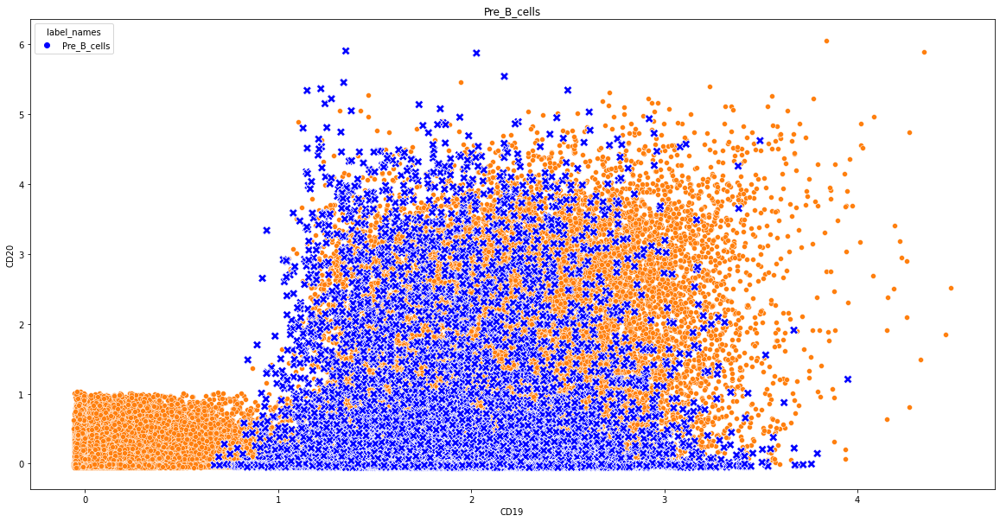

In [ ]:
# One vs rest, Original Data
cluster_name = "Pre_B_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

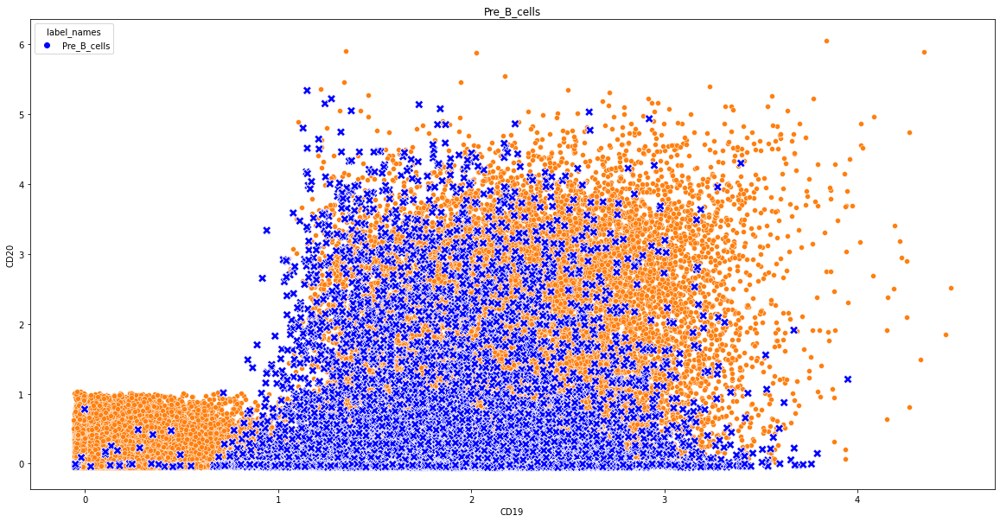

In [ ]:
# One vs rest, KMeans Data
cluster_name = "Pre_B_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

In [ ]:
# Kmeans predicted all basophils points to point to same cluster (hungarian_assignment_matrix[1,9])
# But it also predicted all pDCs to the same cluster (hungarian_assignment_matrix[11,9]). So Hungarian gave this priority (ls_assignment[9] = 11) and assigned some random cluster to Basophils)

# This can be seen in the plots below

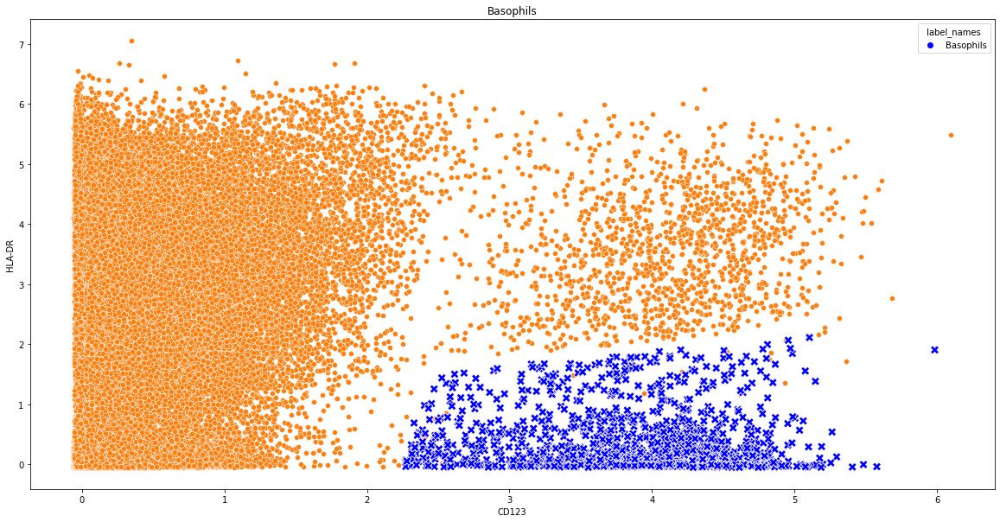

In [ ]:
# One vs rest, Original Data
cluster_name = "Basophils"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

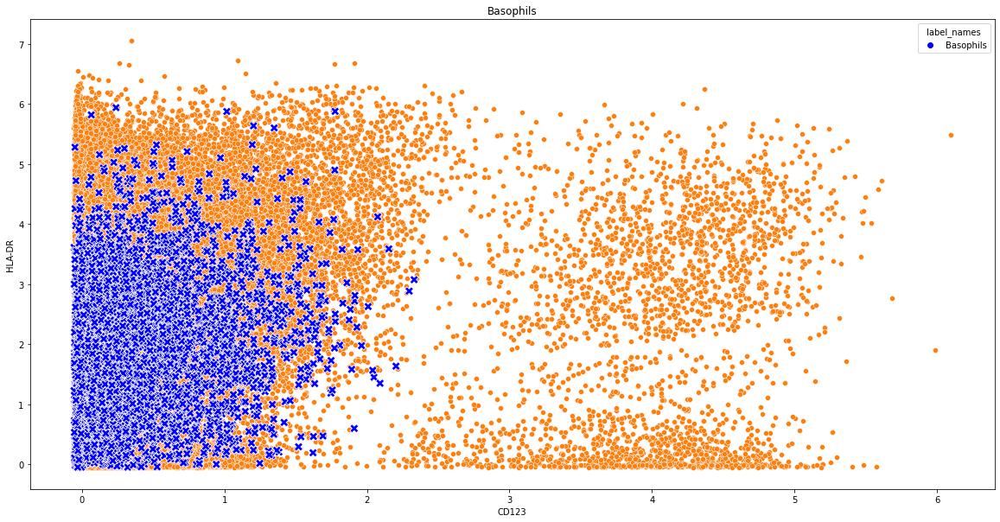

In [ ]:
# One vs rest, KMeans Data
cluster_name = "Basophils"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

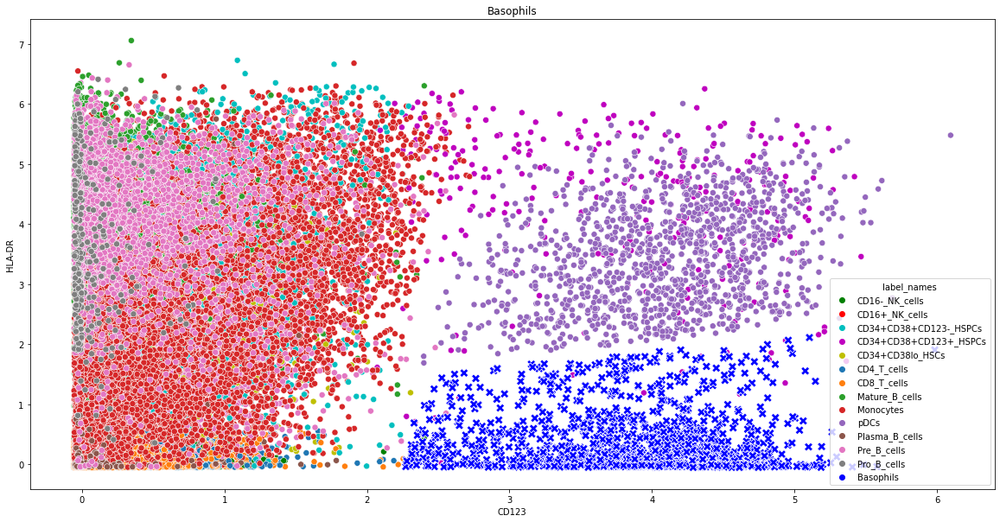

In [ ]:
# Indiv clusters, Original Data
cluster_name = "Basophils"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, False)

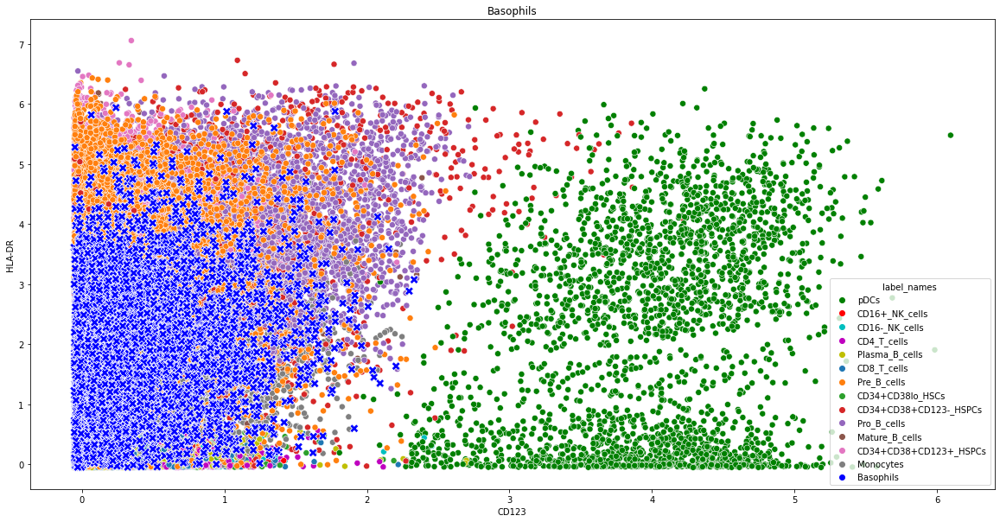

In [ ]:
# Indiv clusters, , KMeans Data
cluster_name = "Basophils"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, False)

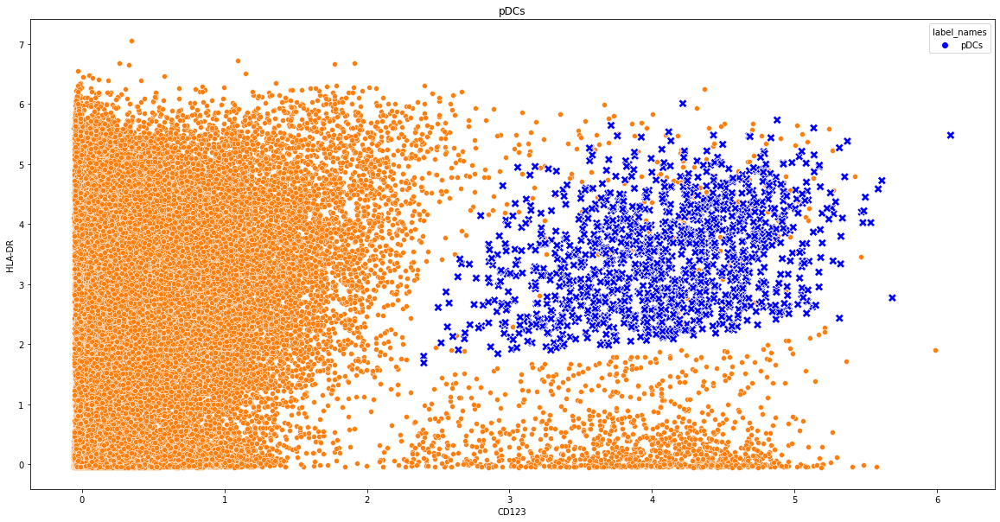

In [ ]:
# One vs rest, Original Data
cluster_name = "pDCs"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

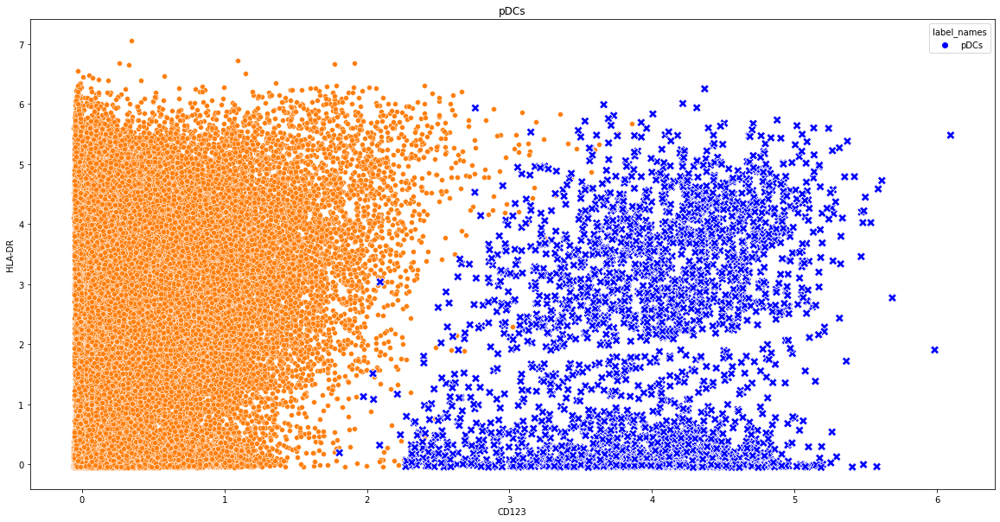

In [ ]:
# One vs rest, KMeans Data
cluster_name = "pDCs"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

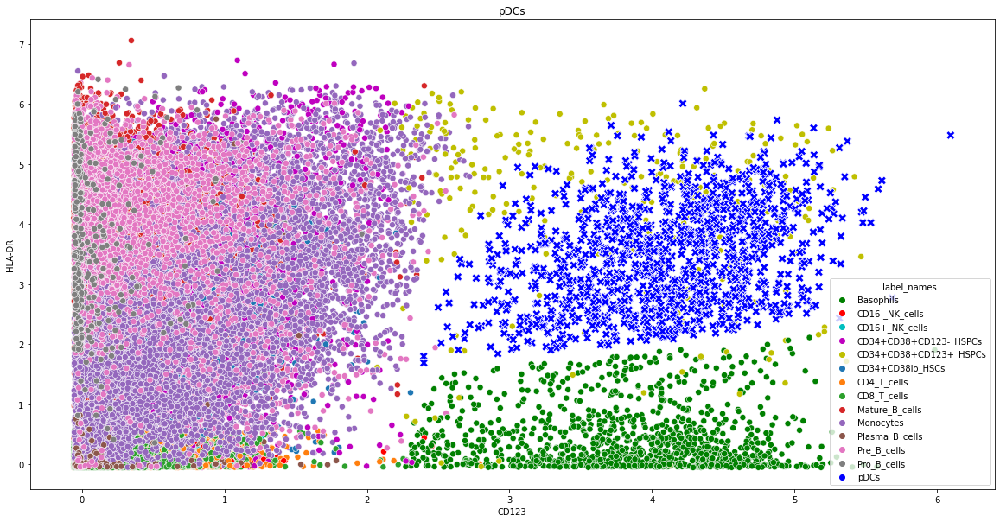

In [ ]:
# One vs rest, Original Data
cluster_name = "pDCs"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, False)

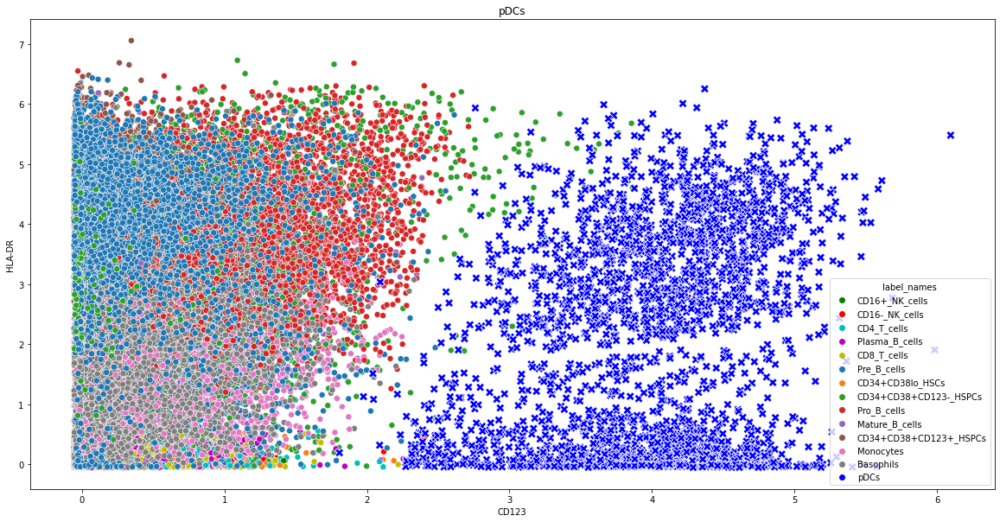

In [ ]:
# One vs rest, KMeans Data
cluster_name = "pDCs"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, False)

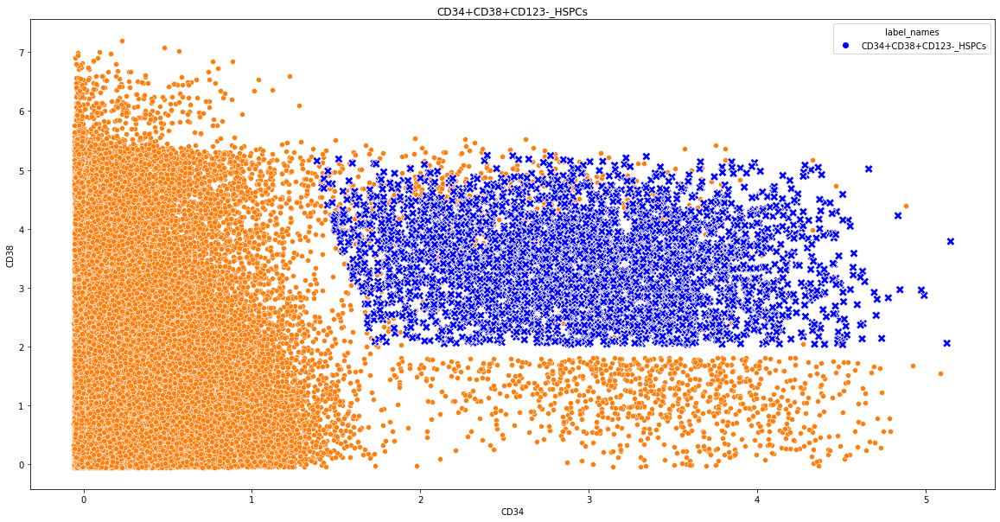

In [ ]:
# One vs rest, Original Data
cluster_name = "CD34+CD38+CD123-_HSPCs"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

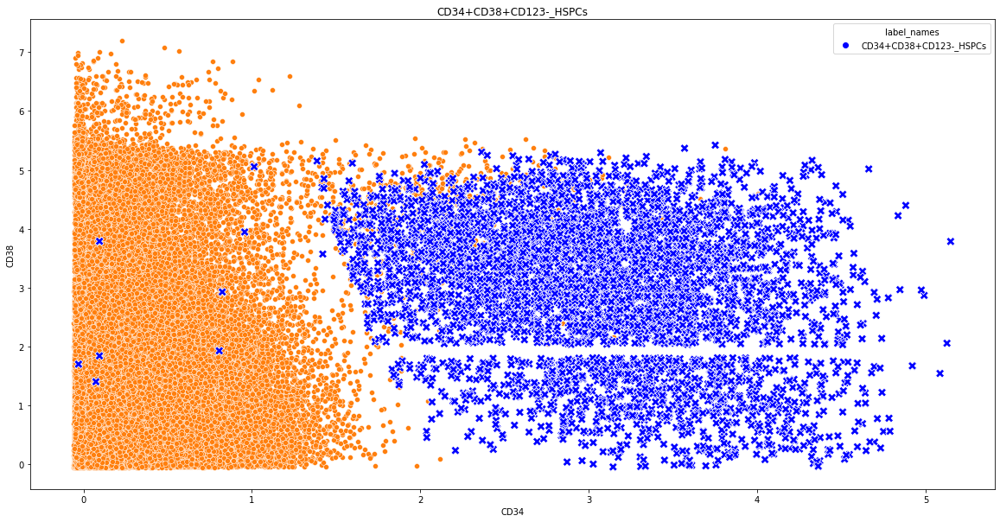

In [ ]:
# Indiv clusters, KMeans Data
cluster_name = "CD34+CD38+CD123-_HSPCs"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

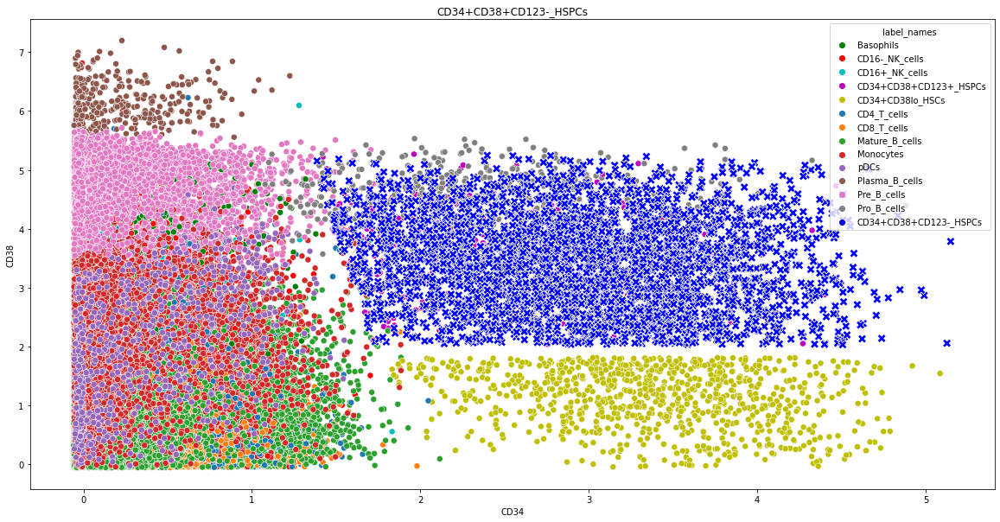

In [ ]:
# One vs rest, Original Data
cluster_name = "CD34+CD38+CD123-_HSPCs"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, False)

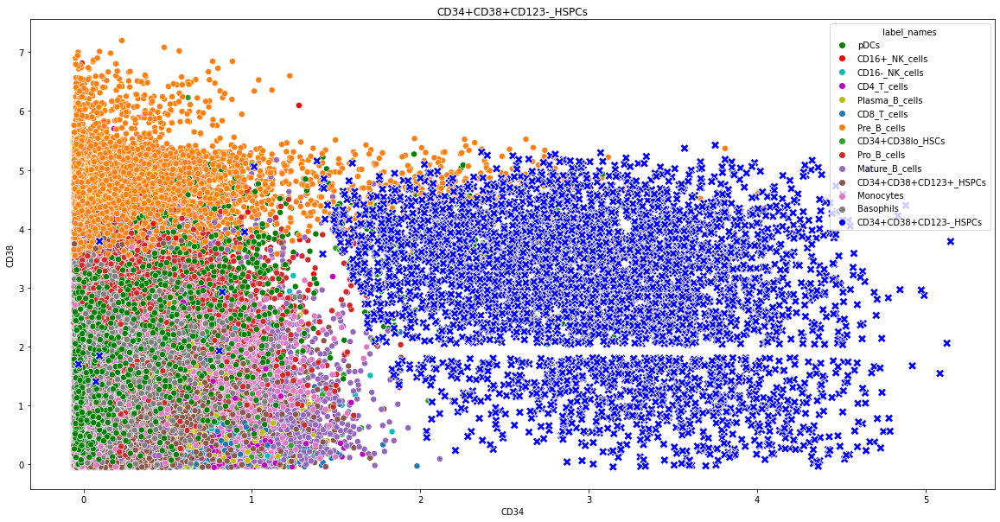

In [ ]:
# Indiv clusters, KMeans Data
cluster_name = "CD34+CD38+CD123-_HSPCs"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, False)

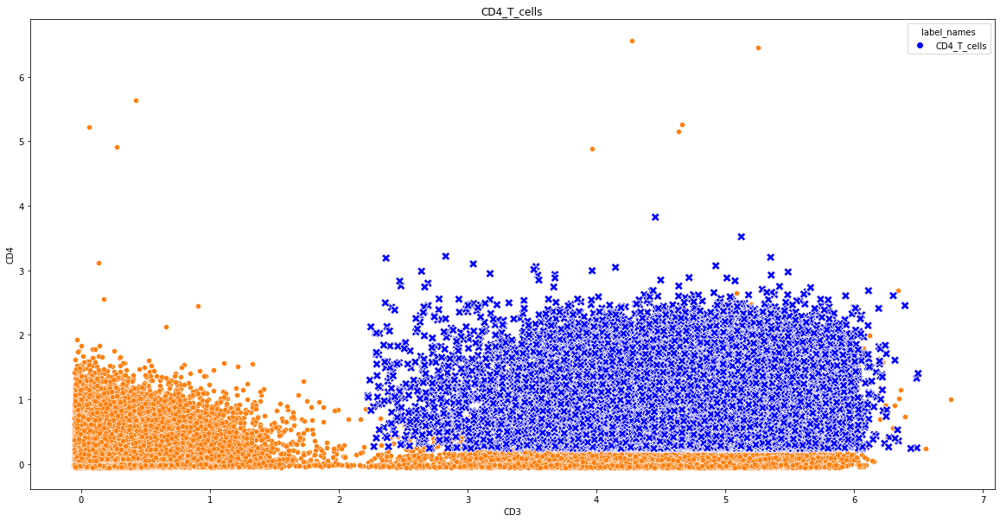

In [ ]:
# One vs rest, Original Data
cluster_name = "CD4_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

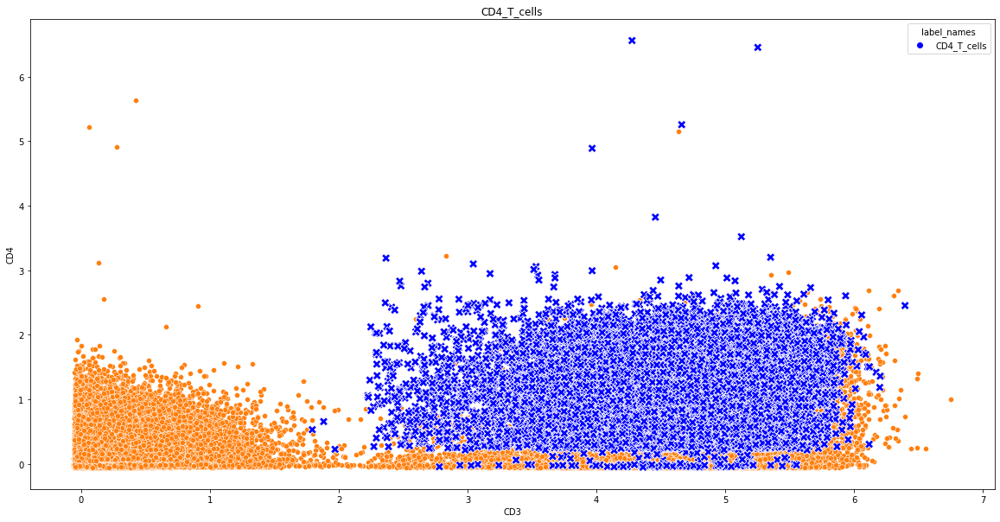

In [ ]:
# One vs rest, KMeans Data
cluster_name = "CD4_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

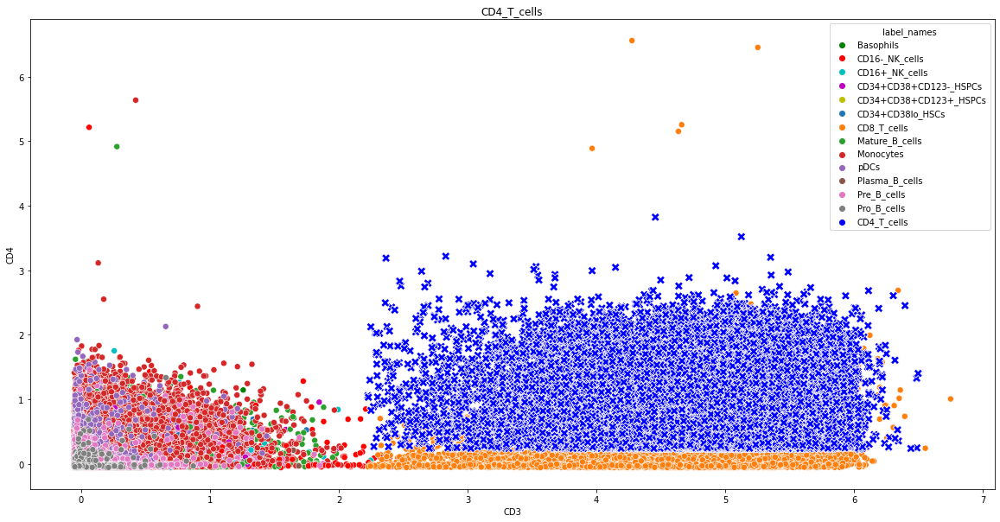

In [ ]:
# One vs rest, Original Data
cluster_name = "CD4_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, False)

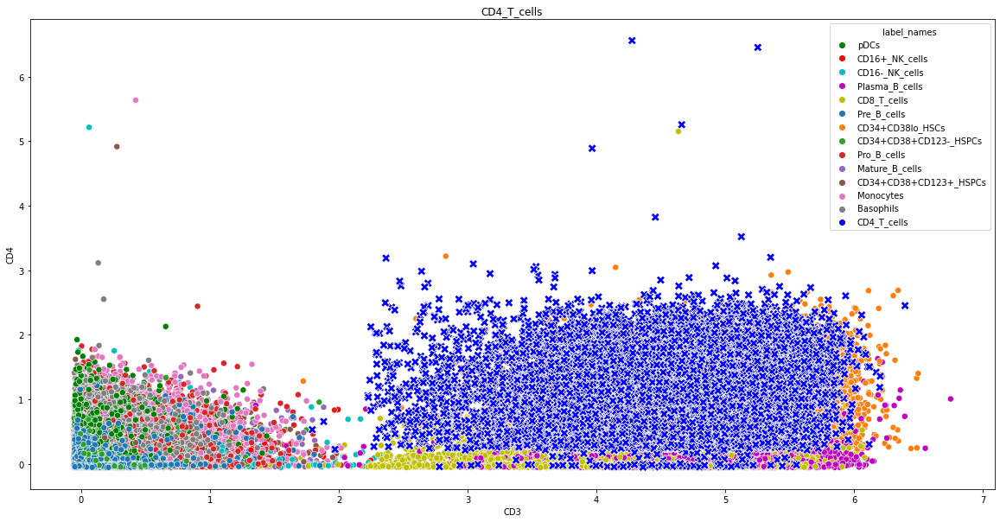

In [ ]:
# One vs rest, KMeans Data
cluster_name = "CD4_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, False)

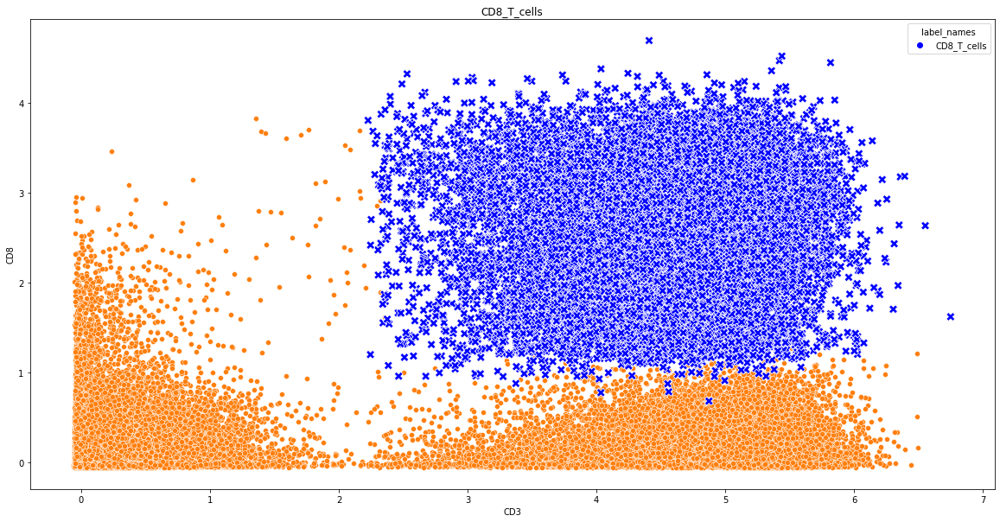

In [ ]:
# One vs rest, Original Data
cluster_name = "CD8_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, True)

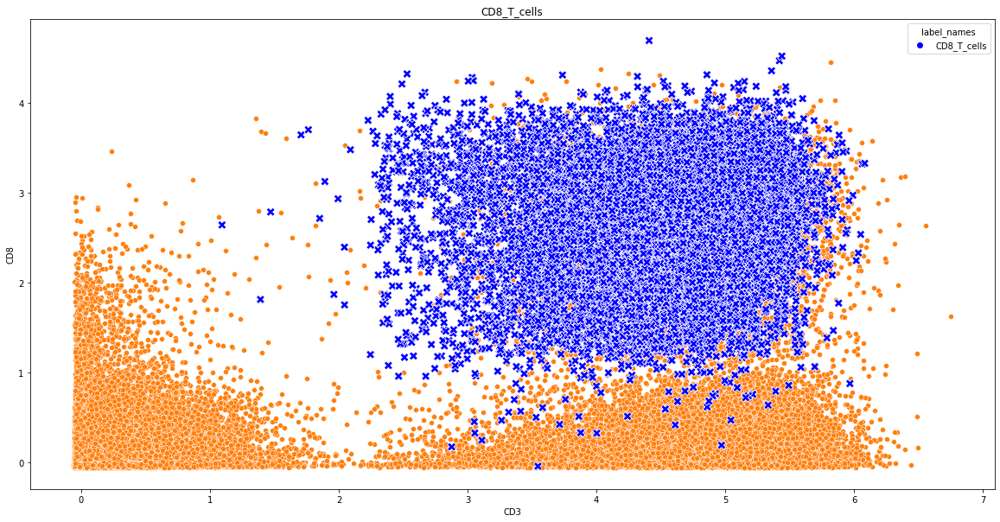

In [ ]:
# One vs rest, KMeans Data
cluster_name = "CD8_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, True)

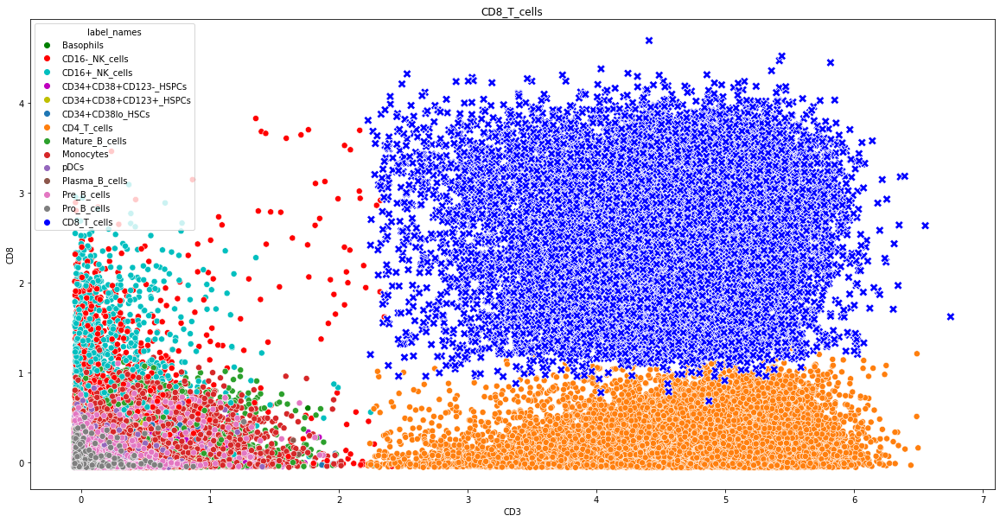

In [ ]:
# One vs rest, Original Data
cluster_name = "CD8_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(orig_data, cluster_name, feats, False)

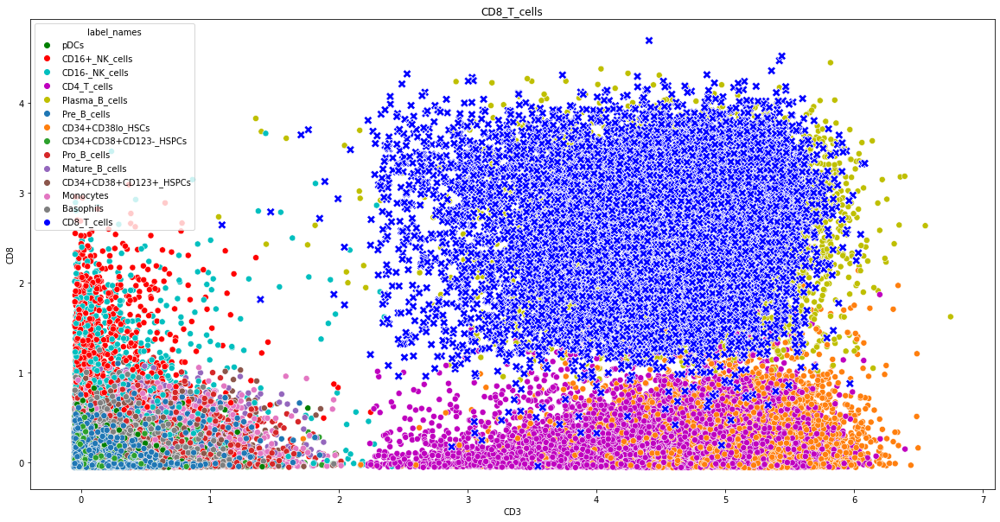

In [ ]:
# One vs rest, KMeans Data
cluster_name = "CD8_T_cells"
feats = fground_labels[cluster_name]
fig = get_scatter(kmeans_data, cluster_name, feats, False)